In [1]:
##Welcome to My Final Project. In this project I have used the following libraries below and am running on a Mac OSMonterrey 12.5.0
## The data I have used can be found at Kaggle.com under "Video_Games_Sales_as_at_22_Dec_2016.csv", and on Yahoo Finance

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
##The whole purpose of this project was to see if sales of video game publishers directly affects its stock price,
## and if so, can I use this to better my opportunities to buy/sell stock.
#Why did I choose this parcticular topic one may ask? well one, I like video games, and two. I like to play and study the stock market.

In [4]:
## Here I started to explore the first dataset and left it as raw to start off. Down below you can see some of the 
## exploratory analysis I have made to further learn about this data.

In [5]:
raw_df = pd.read_csv('Video_Games_Sales_as_at_22_Dec_2016.csv')

In [6]:
raw_df.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
raw_df.Publisher.unique()

array(['Nintendo', 'Microsoft Game Studios', 'Take-Two Interactive',
       'Sony Computer Entertainment', 'Activision', 'Ubisoft',
       'Bethesda Softworks', 'Electronic Arts', 'Sega', 'SquareSoft',
       'Atari', '505 Games', 'Capcom', 'GT Interactive',
       'Konami Digital Entertainment', 'Square Enix',
       'Sony Computer Entertainment Europe', 'Virgin Interactive',
       'LucasArts', 'Warner Bros. Interactive Entertainment',
       'Universal Interactive', 'Eidos Interactive', 'RedOctane',
       'Vivendi Games', 'Enix Corporation', 'Namco Bandai Games',
       'Palcom', 'Hasbro Interactive', 'THQ', 'Fox Interactive',
       'Acclaim Entertainment', 'MTV Games', 'Disney Interactive Studios',
       nan, 'Codemasters', 'Majesco Entertainment', 'Red Orb', 'Level 5',
       'Arena Entertainment', 'Midway Games', 'JVC', 'Deep Silver',
       'NCSoft', '989 Studios', 'UEP Systems', 'Parker Bros.', 'Maxis',
       'Imagic', 'Tecmo Koei', 'ASCII Entertainment', 'Valve Software',


In [8]:
# so I have decided to use the Nintendo, Bethesda Softworks, Ubisoft, Sega, Microsoft Game Studios, Electronic Arts, Sony Computer Entertainment, 
# Valve, Square Enix, Namco Bandai Games publishers because I feel like these companies have the most recognizable Games to those who don't really play video games

In [9]:
# Here you can see that I have filtered out the Publishers that I will use and set them to a new dataframe along 
#some more exploratory analysis down below

In [10]:
filtered_df = raw_df.query('Publisher == "Nintendo" or Publisher == "Bethesda Softworks" or Publisher =="Ubisoft" or Publisher =="Sega" or Publisher =="Microsoft Game Studios" or Publisher =="Electronic Arts" or Publisher =="Sony Computer Entertainment" or Publisher =="Valve" or Publisher =="Square Enix" or Publisher =="Namco Bandai Games"').copy()

In [11]:
filtered_df.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
filtered_df.shape

(5761, 16)

In [13]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5761 entries, 0 to 16701
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             5761 non-null   object 
 1   Platform         5761 non-null   object 
 2   Year_of_Release  5724 non-null   float64
 3   Genre            5761 non-null   object 
 4   Publisher        5761 non-null   object 
 5   NA_Sales         5761 non-null   float64
 6   EU_Sales         5761 non-null   float64
 7   JP_Sales         5761 non-null   float64
 8   Other_Sales      5761 non-null   float64
 9   Global_Sales     5761 non-null   float64
 10  Critic_Score     3182 non-null   float64
 11  Critic_Count     3182 non-null   float64
 12  User_Score       3611 non-null   object 
 13  User_Count       3111 non-null   float64
 14  Developer        3631 non-null   object 
 15  Rating           3595 non-null   object 
dtypes: float64(9), object(7)
memory usage: 765.1+ KB


In [14]:
filtered_df.columns.to_list()

['Name',
 'Platform',
 'Year_of_Release',
 'Genre',
 'Publisher',
 'NA_Sales',
 'EU_Sales',
 'JP_Sales',
 'Other_Sales',
 'Global_Sales',
 'Critic_Score',
 'Critic_Count',
 'User_Score',
 'User_Count',
 'Developer',
 'Rating']

In [15]:
#up above I listed out all the columns this dataset had, to determine the ones I wanted to continue to use that I felt 
# would be good to keep for later on (down below)

In [16]:
filtered_df = filtered_df[['Publisher', 'Year_of_Release', 'Name', 'Genre', 'Global_Sales', 'Critic_Score', 'User_Score' ]]

In [17]:
filtered_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
0,Nintendo,2006.0,Wii Sports,Sports,82.53,76.0,8
1,Nintendo,1985.0,Super Mario Bros.,Platform,40.24,NaN,NaN
2,Nintendo,2008.0,Mario Kart Wii,Racing,35.52,82.0,8.3
3,Nintendo,2009.0,Wii Sports Resort,Sports,32.77,80.0,8
4,Nintendo,1996.0,Pokemon Red/Pokemon Blue,Role-Playing,31.37,NaN,NaN


In [18]:
filtered_df.groupby(['Publisher', 'Year_of_Release'])

In [19]:
#Here down below I proceed to take the larger dataframe and split/sort them by publisher, then have each game release
# sorted by year of release in ascending order

In [20]:
Nintendo_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Nintendo"').sort_values('Year_of_Release')))

In [21]:
Nintendo_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
772,Nintendo,1983.0,Mahjong,Misc,2.14,NaN,NaN
426,Nintendo,1983.0,Baseball,Sports,3.20,NaN,NaN
698,Nintendo,1983.0,Mario Bros.,Platform,2.28,NaN,NaN
1809,Nintendo,1983.0,Donkey Kong,Platform,1.13,NaN,NaN
1843,Nintendo,1983.0,Donkey Kong Jr.,Platform,1.11,NaN,NaN


In [22]:
Bethesda_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Bethesda Softworks"').sort_values('Year_of_Release')))

In [23]:
Bethesda_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
1495,Bethesda Softworks,2002.0,IHRA Drag Racing 2,Racing,1.31,NaN,7.4
7614,Bethesda Softworks,2003.0,IHRA Drag Racing 2004,Racing,0.20,40.0,7.4
7782,Bethesda Softworks,2004.0,IHRA Professional Drag Racing 2005,Racing,0.19,NaN,tbd
12574,Bethesda Softworks,2004.0,IHRA Professional Drag Racing 2005,Racing,0.06,36.0,tbd
12674,Bethesda Softworks,2005.0,NTRA Breeders' Cup World Thoroughbred Champion...,Simulation,0.06,NaN,NaN


In [24]:
Ubisoft_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Ubisoft"').sort_values('Year_of_Release')))

In [25]:
Ubisoft_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
464,Ubisoft,1995.0,Rayman,Platform,3.03,NaN,NaN
8668,Ubisoft,1996.0,Street Racer,Racing,0.16,NaN,NaN
6673,Ubisoft,1997.0,F1 Pole Position 64,Racing,0.25,NaN,NaN
8583,Ubisoft,1998.0,Buck Bumble,Action,0.16,NaN,NaN
12563,Ubisoft,1998.0,S.C.A.R.S,Racing,0.06,NaN,NaN


In [26]:
Sega_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Sega"').sort_values('Year_of_Release')))

In [27]:
Sega_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
4778,Sega,1982.0,Congo Bongo,Action,0.40,NaN,NaN
588,Sega,1990.0,Streets of Rage,Action,2.60,NaN,NaN
257,Sega,1991.0,Sonic the Hedgehog,Platform,4.34,NaN,NaN
13572,Sega,1992.0,Sonic the Hedgehog 2 (8-bit),Platform,0.04,NaN,NaN
145,Sega,1992.0,Sonic the Hedgehog 2,Platform,6.03,NaN,NaN


In [28]:
Microsoft_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Microsoft Game Studios"').sort_values('Year_of_Release')))

In [29]:
Microsoft_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
195,Microsoft Game Studios,1996.0,Microsoft Flight Simulator,Simulation,5.12,NaN,NaN
10885,Microsoft Game Studios,1999.0,Age of Empires II: The Age of Kings,Strategy,0.09,92.0,9
2076,Microsoft Game Studios,2000.0,NFL Fever 2002,Sports,0.99,79.0,8.5
778,Microsoft Game Studios,2001.0,Project Gotham Racing,Racing,2.12,85.0,8.2
2514,Microsoft Game Studios,2001.0,Amped: Freestyle Snowboarding,Sports,0.82,78.0,9


In [30]:
EA_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Electronic Arts"').sort_values('Year_of_Release')))

In [31]:
EA_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
12651,Electronic Arts,1992.0,Syndicate,Strategy,0.06,NaN,NaN
3489,Electronic Arts,1994.0,Theme Park,Simulation,0.57,NaN,NaN
11304,Electronic Arts,1994.0,Theme Park,Simulation,0.08,NaN,NaN
16670,Electronic Arts,1995.0,Psychic Detective,Adventure,0.01,NaN,NaN
12962,Electronic Arts,1995.0,Hi-Octane: The Track Fights Back!,Racing,0.05,NaN,NaN


In [32]:
Sony_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Sony Computer Entertainment"').sort_values('Year_of_Release')))

In [33]:
Sony_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
5083,Sony Computer Entertainment,1994.0,Kileak: The DNA Imperative,Shooter,0.37,NaN,NaN
10678,Sony Computer Entertainment,1994.0,Crime Crackers,Role-Playing,0.10,NaN,NaN
4348,Sony Computer Entertainment,1994.0,NHL FaceOff,Sports,0.45,NaN,NaN
1567,Sony Computer Entertainment,1994.0,Battle Arena Toshinden,Fighting,1.27,69.0,6.3
4992,Sony Computer Entertainment,1994.0,ESPN Extreme Games,Sports,0.38,NaN,NaN


In [34]:
Valve_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Valve"').sort_values('Year_of_Release')))

In [35]:
Valve_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
1052,Valve,2011.0,Portal 2,Shooter,1.7,95.0,8.4


In [36]:
SqE_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Square Enix"').sort_values('Year_of_Release')))

In [37]:
SqE_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
3588,Square Enix,2003.0,Fullmetal Alchemist and the Broken Angel,Role-Playing,0.56,56.0,8.1
3694,Square Enix,2003.0,Front Mission 4,Strategy,0.54,75.0,8.6
5128,Square Enix,2003.0,Slime MoriMori Dragon Quest: Shougeki No Shipp...,Adventure,0.37,NaN,NaN
3109,Square Enix,2003.0,Drakengard,Role-Playing,0.65,63.0,9.1
9315,Square Enix,2003.0,Final Fantasy XI: Rise of the Zilart,Role-Playing,0.13,NaN,NaN


In [38]:
Namco_df = pd.DataFrame(data =(filtered_df.query('Publisher == "Namco Bandai Games"').sort_values('Year_of_Release')))

In [39]:
Namco_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
1233,Namco Bandai Games,1984.0,Xevious,Shooter,1.52,NaN,NaN
2950,Namco Bandai Games,1984.0,Mappy,Platform,0.69,NaN,NaN
1639,Namco Bandai Games,1984.0,Pac-Man,Puzzle,1.22,NaN,NaN
4709,Namco Bandai Games,1985.0,Dig Dug,Puzzle,0.41,NaN,NaN
1971,Namco Bandai Games,1985.0,Tag Team Match M.U.S.C.L.E.,Fighting,1.05,NaN,NaN


In [40]:
# After completing the previous task, I then put the newly sorted and filtered smaller dataframes into one Master dataframe

In [41]:
Master_df = pd.concat([Namco_df, SqE_df])

In [42]:
Master_df

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
1233,Namco Bandai Games,1984.0,Xevious,Shooter,1.52,NaN,NaN
2950,Namco Bandai Games,1984.0,Mappy,Platform,0.69,NaN,NaN
1639,Namco Bandai Games,1984.0,Pac-Man,Puzzle,1.22,NaN,NaN
4709,Namco Bandai Games,1985.0,Dig Dug,Puzzle,0.41,NaN,NaN
1971,Namco Bandai Games,1985.0,Tag Team Match M.U.S.C.L.E.,Fighting,1.05,NaN,NaN
453,Namco Bandai Games,1986.0,World Class Track Meet,Sports,3.08,NaN,NaN
740,Namco Bandai Games,1986.0,Pro Yakyuu Family Stadium,Sports,2.20,NaN,NaN
1589,Namco Bandai Games,1987.0,Gegege no Kitarou 2: Youkai Gundan no Chousen,Role-Playing,1.25,NaN,NaN
1355,Namco Bandai Games,1987.0,Pro Yakyuu Family Stadium '87,Sports,1.42,NaN,NaN
1588,Namco Bandai Games,1988.0,Dragon Ball: Daimaou Fukkatsu,Role-Playing,1.25,NaN,NaN


In [43]:
Master_df = pd.concat([Master_df, Sony_df, EA_df])

In [44]:
Master_df

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
1233,Namco Bandai Games,1984.0,Xevious,Shooter,1.52,NaN,NaN
2950,Namco Bandai Games,1984.0,Mappy,Platform,0.69,NaN,NaN
1639,Namco Bandai Games,1984.0,Pac-Man,Puzzle,1.22,NaN,NaN
4709,Namco Bandai Games,1985.0,Dig Dug,Puzzle,0.41,NaN,NaN
1971,Namco Bandai Games,1985.0,Tag Team Match M.U.S.C.L.E.,Fighting,1.05,NaN,NaN
453,Namco Bandai Games,1986.0,World Class Track Meet,Sports,3.08,NaN,NaN
740,Namco Bandai Games,1986.0,Pro Yakyuu Family Stadium,Sports,2.20,NaN,NaN
1589,Namco Bandai Games,1987.0,Gegege no Kitarou 2: Youkai Gundan no Chousen,Role-Playing,1.25,NaN,NaN
1355,Namco Bandai Games,1987.0,Pro Yakyuu Family Stadium '87,Sports,1.42,NaN,NaN
1588,Namco Bandai Games,1988.0,Dragon Ball: Daimaou Fukkatsu,Role-Playing,1.25,NaN,NaN


In [45]:
Master_df = pd.concat([Master_df, Microsoft_df, Sega_df, Ubisoft_df, Bethesda_df, Nintendo_df, Valve_df])

In [46]:
Master_df

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
1233,Namco Bandai Games,1984.0,Xevious,Shooter,1.52,NaN,NaN
2950,Namco Bandai Games,1984.0,Mappy,Platform,0.69,NaN,NaN
1639,Namco Bandai Games,1984.0,Pac-Man,Puzzle,1.22,NaN,NaN
4709,Namco Bandai Games,1985.0,Dig Dug,Puzzle,0.41,NaN,NaN
1971,Namco Bandai Games,1985.0,Tag Team Match M.U.S.C.L.E.,Fighting,1.05,NaN,NaN
453,Namco Bandai Games,1986.0,World Class Track Meet,Sports,3.08,NaN,NaN
740,Namco Bandai Games,1986.0,Pro Yakyuu Family Stadium,Sports,2.20,NaN,NaN
1589,Namco Bandai Games,1987.0,Gegege no Kitarou 2: Youkai Gundan no Chousen,Role-Playing,1.25,NaN,NaN
1355,Namco Bandai Games,1987.0,Pro Yakyuu Family Stadium '87,Sports,1.42,NaN,NaN
1588,Namco Bandai Games,1988.0,Dragon Ball: Daimaou Fukkatsu,Role-Playing,1.25,NaN,NaN


In [47]:
Master_df = Master_df.reset_index(drop = True)

In [48]:
Master_df

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
0,Namco Bandai Games,1984.0,Xevious,Shooter,1.52,NaN,NaN
1,Namco Bandai Games,1984.0,Mappy,Platform,0.69,NaN,NaN
2,Namco Bandai Games,1984.0,Pac-Man,Puzzle,1.22,NaN,NaN
3,Namco Bandai Games,1985.0,Dig Dug,Puzzle,0.41,NaN,NaN
4,Namco Bandai Games,1985.0,Tag Team Match M.U.S.C.L.E.,Fighting,1.05,NaN,NaN
5,Namco Bandai Games,1986.0,World Class Track Meet,Sports,3.08,NaN,NaN
6,Namco Bandai Games,1986.0,Pro Yakyuu Family Stadium,Sports,2.20,NaN,NaN
7,Namco Bandai Games,1987.0,Gegege no Kitarou 2: Youkai Gundan no Chousen,Role-Playing,1.25,NaN,NaN
8,Namco Bandai Games,1987.0,Pro Yakyuu Family Stadium '87,Sports,1.42,NaN,NaN
9,Namco Bandai Games,1988.0,Dragon Ball: Daimaou Fukkatsu,Role-Playing,1.25,NaN,NaN


In [49]:
Master_df.isnull().sum()

Publisher             0
Year_of_Release      37
Name                  0
Genre                 0
Global_Sales          0
Critic_Score       2579
User_Score         2150
dtype: int64

In [50]:
Master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5761 entries, 0 to 5760
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Publisher        5761 non-null   object 
 1   Year_of_Release  5724 non-null   float64
 2   Name             5761 non-null   object 
 3   Genre            5761 non-null   object 
 4   Global_Sales     5761 non-null   float64
 5   Critic_Score     3182 non-null   float64
 6   User_Score       3611 non-null   object 
dtypes: float64(3), object(4)
memory usage: 315.2+ KB


In [51]:
#With the new Master_df I then proceed to set make a copy of the Master called Sales_df where I then decide to drop the
# columns 'Critics_Score' and 'User_Score'. After all, I am only focusing on the sales made and the stock prices

In [52]:
Master_df.to_csv('Master Data.csv',index=False)

In [53]:
Sales_df= Master_df.copy()

In [54]:
Sales_df.drop(columns=['Critic_Score', 'User_Score'],inplace=True)

In [55]:
Sales_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales
0,Namco Bandai Games,1984.0,Xevious,Shooter,1.52
1,Namco Bandai Games,1984.0,Mappy,Platform,0.69
2,Namco Bandai Games,1984.0,Pac-Man,Puzzle,1.22
3,Namco Bandai Games,1985.0,Dig Dug,Puzzle,0.41
4,Namco Bandai Games,1985.0,Tag Team Match M.U.S.C.L.E.,Fighting,1.05


In [56]:
Sales_df.dropna(inplace=True)

In [57]:
Scores_df= Master_df.copy()

In [58]:
Sales_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5724 entries, 0 to 5760
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Publisher        5724 non-null   object 
 1   Year_of_Release  5724 non-null   float64
 2   Name             5724 non-null   object 
 3   Genre            5724 non-null   object 
 4   Global_Sales     5724 non-null   float64
dtypes: float64(2), object(3)
memory usage: 268.3+ KB


In [59]:
Scores_df.dropna(inplace=True)

In [60]:
Scores_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3149 entries, 65 to 5760
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Publisher        3149 non-null   object 
 1   Year_of_Release  3149 non-null   float64
 2   Name             3149 non-null   object 
 3   Genre            3149 non-null   object 
 4   Global_Sales     3149 non-null   float64
 5   Critic_Score     3149 non-null   float64
 6   User_Score       3149 non-null   object 
dtypes: float64(3), object(4)
memory usage: 196.8+ KB


In [61]:
Master_df.Year_of_Release.unique()

array([1984., 1985., 1986., 1987., 1988., 1989., 1990., 1991., 1992.,
       1993., 1994., 1995., 1996., 1997., 1998., 1999., 2000., 2001.,
       2002., 2003., 2004., 2005., 2006., 2007., 2008., 2009., 2010.,
       2011., 2012., 2013., 2014., 2015., 2016.,   nan, 1982., 2017.,
       2020., 1983.])

In [62]:
Master_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales,Critic_Score,User_Score
0,Namco Bandai Games,1984.0,Xevious,Shooter,1.52,NaN,NaN
1,Namco Bandai Games,1984.0,Mappy,Platform,0.69,NaN,NaN
2,Namco Bandai Games,1984.0,Pac-Man,Puzzle,1.22,NaN,NaN
3,Namco Bandai Games,1985.0,Dig Dug,Puzzle,0.41,NaN,NaN
4,Namco Bandai Games,1985.0,Tag Team Match M.U.S.C.L.E.,Fighting,1.05,NaN,NaN


In [63]:
Nintendo_df.Year_of_Release.unique()

array([1983., 1984., 1985., 1986., 1987., 1988., 1989., 1990., 1991.,
       1992., 1993., 1994., 1995., 1996., 1997., 1998., 1999., 2000.,
       2001., 2002., 2003., 2004., 2005., 2006., 2007., 2008., 2009.,
       2010., 2011., 2012., 2013., 2014., 2015., 2016.,   nan])

In [64]:
Nintendo_df.drop(columns= ['Critic_Score', 'User_Score'],inplace=True)

In [65]:
Nintendo_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales
772,Nintendo,1983.0,Mahjong,Misc,2.14
426,Nintendo,1983.0,Baseball,Sports,3.20
698,Nintendo,1983.0,Mario Bros.,Platform,2.28
1809,Nintendo,1983.0,Donkey Kong,Platform,1.13
1843,Nintendo,1983.0,Donkey Kong Jr.,Platform,1.11


In [66]:
Nintendo_df.dropna(inplace=True)

In [67]:
Nintendo_df.Year_of_Release= Nintendo_df.Year_of_Release.astype(int)

In [68]:
Nintendo_df.head()

,Publisher,Year_of_Release,Name,Genre,Global_Sales
772,Nintendo,1983,Mahjong,Misc,2.14
426,Nintendo,1983,Baseball,Sports,3.20
698,Nintendo,1983,Mario Bros.,Platform,2.28
1809,Nintendo,1983,Donkey Kong,Platform,1.13
1843,Nintendo,1983,Donkey Kong Jr.,Platform,1.11


In [69]:
#here I take the global totals from the Nintendo_df and add up all the ones from 1983

In [70]:
Nintendo_df.loc[(Nintendo_df['Year_of_Release']==1983), 'Global_Sales'].sum()

10.959999999999999

In [71]:
Ninarr= Nintendo_df.Year_of_Release.unique()

In [72]:
#here I take all the release years and put them in an array

In [73]:
yearslist = Ninarr.tolist()

In [74]:
yearslist

[1983,
 1984,
 1985,
 1986,
 1987,
 1988,
 1989,
 1990,
 1991,
 1992,
 1993,
 1994,
 1995,
 1996,
 1997,
 1998,
 1999,
 2000,
 2001,
 2002,
 2003,
 2004,
 2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013,
 2014,
 2015,
 2016]

In [75]:
def get_totals(df):
    total_sales= []
    
    for year in yearslist: 
        
            tot= df.loc[(df['Year_of_Release']==year), 'Global_Sales'].sum()
            total_sales.append(tot)
            
    return total_sales
        

In [76]:
# in this part, I take all the years with their global totals and add them up for each year

In [77]:
Nintendo_totals= get_totals(Nintendo_df)

In [78]:
Nintendo_totals

[10.959999999999999,
 45.56,
 49.949999999999996,
 16.180000000000003,
 11.950000000000001,
 36.44,
 63.88,
 35.49,
 15.97,
 38.11,
 20.04,
 24.990000000000002,
 16.720000000000002,
 73.7,
 25.799999999999997,
 48.410000000000004,
 65.33,
 34.050000000000004,
 45.370000000000005,
 48.31000000000001,
 38.14,
 60.52,
 126.69,
 204.42,
 103.09,
 90.01,
 127.39000000000001,
 59.74000000000001,
 51.690000000000005,
 56.11,
 53.480000000000004,
 48.88,
 27.61,
 11.739999999999998]

In [79]:
#after all that I throw it in a new dataframe called Global_Totals where I have the release year totals added up and 
#listed down below

In [80]:
Nintendo_Sale= {'Publisher': 'Nintendo', 'Year':yearslist,'Total_Sales':Nintendo_totals }
Global_totals= pd.DataFrame(data= Nintendo_Sale)

In [81]:
Global_totals.head()

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95


In [82]:
#I then repeat this process for all the other publishers and their totals

In [83]:
Namco_totals= get_totals(Namco_df)

In [84]:
Namco_totals

[0.0,
 3.4299999999999997,
 1.46,
 5.28,
 2.67,
 2.4299999999999997,
 1.1,
 0.63,
 1.03,
 1.04,
 5.379999999999999,
 1.7200000000000002,
 2.52,
 3.49,
 6.340000000000001,
 5.86,
 4.94,
 9.7,
 7.88,
 12.979999999999999,
 10.46,
 5.489999999999999,
 14.77,
 11.670000000000002,
 7.510000000000001,
 10.8,
 16.650000000000002,
 16.169999999999998,
 21.680000000000007,
 15.709999999999999,
 9.739999999999998,
 9.270000000000001,
 15.78,
 8.609999999999998]

In [85]:
 Namco_Sale= {'Publisher': 'Namco', 'Year':yearslist,'Total_Sales':Namco_totals }
Namco_total_sales= pd.DataFrame(data=Namco_Sale)
Namco_total_sales.head()

,Publisher,Year,Total_Sales
0,Namco,1983,0.00
1,Namco,1984,3.43
2,Namco,1985,1.46
3,Namco,1986,5.28
4,Namco,1987,2.67


In [86]:
Global_totals= pd.concat([Global_totals, Namco_total_sales], ignore_index=True)
Global_totals

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95
5,Nintendo,1988,36.44
6,Nintendo,1989,63.88
7,Nintendo,1990,35.49
8,Nintendo,1991,15.97
9,Nintendo,1992,38.11


In [87]:
Sega_totals= get_totals(Sega_df)

In [88]:
Sega_totals

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.6,
 4.34,
 7.98,
 1.9300000000000002,
 7.53,
 7.930000000000001,
 4.29,
 2.1399999999999997,
 4.59,
 4.36,
 3.8800000000000003,
 6.6000000000000005,
 12.300000000000004,
 12.530000000000001,
 11.929999999999998,
 11.530000000000001,
 15.68,
 23.410000000000004,
 36.83,
 24.540000000000003,
 22.280000000000005,
 16.46,
 8.93,
 5.039999999999999,
 5.410000000000001,
 1.6300000000000001,
 0.9900000000000001]

In [89]:
 Sega_Sale= {'Publisher': 'Sega', 'Year':yearslist,'Total_Sales':Sega_totals }
Sega_total_sales= pd.DataFrame(data=Sega_Sale)
Sega_total_sales.head()

,Publisher,Year,Total_Sales
0,Sega,1983,0.0
1,Sega,1984,0.0
2,Sega,1985,0.0
3,Sega,1986,0.0
4,Sega,1987,0.0


In [90]:
Global_totals= pd.concat([Global_totals, Sega_total_sales], ignore_index=True)
Global_totals

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95
5,Nintendo,1988,36.44
6,Nintendo,1989,63.88
7,Nintendo,1990,35.49
8,Nintendo,1991,15.97
9,Nintendo,1992,38.11


In [91]:
Bethesda_totals= get_totals(Bethesda_df)

In [92]:
Bethesda_totals

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.31,
 0.2,
 0.25,
 0.19,
 0.1,
 1.03,
 11.27,
 1.2600000000000002,
 8.33,
 24.82,
 4.82,
 0.0,
 8.43,
 16.92,
 5.51]

In [93]:
 Bethesda_Sale= {'Publisher': 'Bethesda Softworks', 'Year':yearslist,'Total_Sales':Bethesda_totals }
Bethesda_total_sales= pd.DataFrame(data=Bethesda_Sale)
Bethesda_total_sales.head()

,Publisher,Year,Total_Sales
0,Bethesda Softworks,1983,0.0
1,Bethesda Softworks,1984,0.0
2,Bethesda Softworks,1985,0.0
3,Bethesda Softworks,1986,0.0
4,Bethesda Softworks,1987,0.0


In [94]:
Global_totals= pd.concat([Global_totals, Bethesda_total_sales], ignore_index=True)
Global_totals

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95
5,Nintendo,1988,36.44
6,Nintendo,1989,63.88
7,Nintendo,1990,35.49
8,Nintendo,1991,15.97
9,Nintendo,1992,38.11


In [95]:
Ubisoft_totals= get_totals(Ubisoft_df)

In [96]:
Ubisoft_totals

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.03,
 0.16,
 0.25,
 0.3,
 4.609999999999999,
 4.749999999999999,
 4.99,
 16.21,
 16.89,
 15.380000000000003,
 16.46,
 17.12,
 48.209999999999994,
 56.86,
 46.309999999999995,
 41.93,
 47.18,
 36.540000000000006,
 26.79,
 40.85,
 12.71,
 12.629999999999999]

In [97]:
 Ubisoft_Sale= {'Publisher': 'Ubisoft', 'Year':yearslist,'Total_Sales':Ubisoft_totals }
Ubisoft_total_sales= pd.DataFrame(data=Ubisoft_Sale)
Ubisoft_total_sales.head()

,Publisher,Year,Total_Sales
0,Ubisoft,1983,0.0
1,Ubisoft,1984,0.0
2,Ubisoft,1985,0.0
3,Ubisoft,1986,0.0
4,Ubisoft,1987,0.0


In [98]:
Global_totals= pd.concat([Global_totals, Ubisoft_total_sales], ignore_index=True)
Global_totals

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95
5,Nintendo,1988,36.44
6,Nintendo,1989,63.88
7,Nintendo,1990,35.49
8,Nintendo,1991,15.97
9,Nintendo,1992,38.11


In [99]:
Microsoft_totals= get_totals(Microsoft_df)

In [100]:
Microsoft_totals

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 5.12,
 0.0,
 0.0,
 0.09,
 0.99,
 13.489999999999998,
 6.96,
 8.92,
 13.680000000000001,
 5.68,
 9.95,
 25.99,
 15.2,
 15.55,
 48.989999999999995,
 21.07,
 15.120000000000001,
 16.41,
 10.709999999999999,
 10.560000000000002,
 3.8400000000000003]

In [101]:
 Microsoft_Sale= {'Publisher': 'Microsoft Game Studios', 'Year':yearslist,'Total_Sales':Microsoft_totals }
Microsoft_total_sales= pd.DataFrame(data=Microsoft_Sale)
Microsoft_total_sales.head()

,Publisher,Year,Total_Sales
0,Microsoft Game Studios,1983,0.0
1,Microsoft Game Studios,1984,0.0
2,Microsoft Game Studios,1985,0.0
3,Microsoft Game Studios,1986,0.0
4,Microsoft Game Studios,1987,0.0


In [102]:
Global_totals= pd.concat([Global_totals, Microsoft_total_sales], ignore_index=True)
Global_totals

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95
5,Nintendo,1988,36.44
6,Nintendo,1989,63.88
7,Nintendo,1990,35.49
8,Nintendo,1991,15.97
9,Nintendo,1992,38.11


In [103]:
EA_totals= get_totals(EA_df)

In [104]:
EA_totals

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.06,
 0.0,
 0.6499999999999999,
 3.3299999999999996,
 7.9,
 22.94,
 29.95,
 20.14,
 25.130000000000003,
 45.12,
 73.01,
 69.81999999999998,
 67.28,
 66.82999999999998,
 58.2,
 70.66,
 83.41,
 85.28,
 80.25999999999999,
 71.50999999999999,
 48.98,
 52.18,
 45.19,
 45.74,
 26.480000000000004]

In [105]:
 EA_Sale= {'Publisher': 'Electronic Arts', 'Year':yearslist,'Total_Sales':EA_totals }
EA_total_sales= pd.DataFrame(data=EA_Sale)
EA_total_sales.head()

,Publisher,Year,Total_Sales
0,Electronic Arts,1983,0.0
1,Electronic Arts,1984,0.0
2,Electronic Arts,1985,0.0
3,Electronic Arts,1986,0.0
4,Electronic Arts,1987,0.0


In [106]:
Global_totals= pd.concat([Global_totals, EA_total_sales], ignore_index=True)
Global_totals

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95
5,Nintendo,1988,36.44
6,Nintendo,1989,63.88
7,Nintendo,1990,35.49
8,Nintendo,1991,15.97
9,Nintendo,1992,38.11


In [107]:
Sony_totals= get_totals(Sony_df)

In [108]:
Sony_totals

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.4299999999999997,
 18.450000000000003,
 35.07,
 43.900000000000006,
 34.64,
 36.24,
 21.689999999999998,
 43.28999999999999,
 25.85,
 24.32,
 35.15,
 26.33,
 33.72,
 37.349999999999994,
 26.37,
 36.14999999999999,
 34.49999999999999,
 26.730000000000004,
 12.180000000000001,
 11.969999999999999,
 18.639999999999997,
 11.23,
 9.069999999999999]

In [109]:
 Sony_Sale= {'Publisher': 'Sony Computer Entertanment', 'Year':yearslist,'Total_Sales':Sony_totals }
Sony_total_sales= pd.DataFrame(data=Sony_Sale)
Sony_total_sales.head()

,Publisher,Year,Total_Sales
0,Sony Computer Entertanment,1983,0.0
1,Sony Computer Entertanment,1984,0.0
2,Sony Computer Entertanment,1985,0.0
3,Sony Computer Entertanment,1986,0.0
4,Sony Computer Entertanment,1987,0.0


In [110]:
Global_totals= pd.concat([Global_totals, Sony_total_sales], ignore_index=True)
Global_totals

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95
5,Nintendo,1988,36.44
6,Nintendo,1989,63.88
7,Nintendo,1990,35.49
8,Nintendo,1991,15.97
9,Nintendo,1992,38.11


In [111]:
SqE_totals= get_totals(SqE_df)

In [112]:
SqE_totals

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.42,
 8.14,
 6.7,
 13.37,
 16.020000000000003,
 9.82,
 10.7,
 17.24,
 12.26,
 9.26,
 13.4,
 10.21,
 8.99,
 5.38]

In [113]:
 SqE_Sale= {'Publisher': 'Square Enix', 'Year':yearslist,'Total_Sales':SqE_totals }
SqE_total_sales= pd.DataFrame(data=SqE_Sale)
SqE_total_sales.head()

,Publisher,Year,Total_Sales
0,Square Enix,1983,0.0
1,Square Enix,1984,0.0
2,Square Enix,1985,0.0
3,Square Enix,1986,0.0
4,Square Enix,1987,0.0


In [114]:
Global_totals= pd.concat([Global_totals, SqE_total_sales], ignore_index=True)
Global_totals

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95
5,Nintendo,1988,36.44
6,Nintendo,1989,63.88
7,Nintendo,1990,35.49
8,Nintendo,1991,15.97
9,Nintendo,1992,38.11


In [115]:
Valve_totals= get_totals(Valve_df)

In [116]:
Valve_totals

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.7,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [117]:
 Valve_Sale= {'Publisher': 'Valve', 'Year':yearslist,'Total_Sales':Valve_totals }
Valve_total_sales= pd.DataFrame(data=Valve_Sale)
Valve_total_sales.head()

,Publisher,Year,Total_Sales
0,Valve,1983,0.0
1,Valve,1984,0.0
2,Valve,1985,0.0
3,Valve,1986,0.0
4,Valve,1987,0.0


In [118]:
Global_totals= pd.concat([Global_totals, Valve_total_sales], ignore_index=True)
Global_totals

,Publisher,Year,Total_Sales
0,Nintendo,1983,10.96
1,Nintendo,1984,45.56
2,Nintendo,1985,49.95
3,Nintendo,1986,16.18
4,Nintendo,1987,11.95
5,Nintendo,1988,36.44
6,Nintendo,1989,63.88
7,Nintendo,1990,35.49
8,Nintendo,1991,15.97
9,Nintendo,1992,38.11


In [119]:
#After filling up the new Dataframe I decided to make barcharts to better visualize each companies sales so I can 
#compare them to each of their selling years

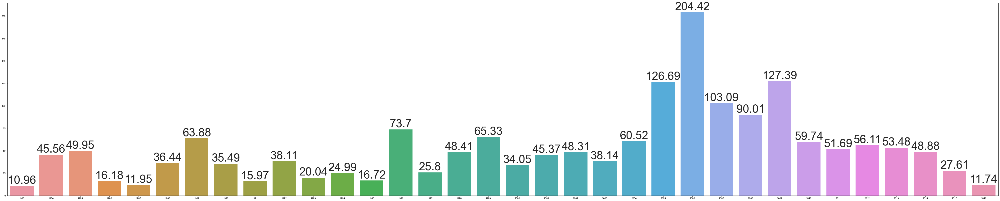

In [120]:
Nintendo_bar=sns.barplot(x='Year', y='Total_Sales', data=Nintendo_Sale)
Nintendo_bar.figure.set_size_inches(75,15)
sns.set(font_scale=4)
for i in Nintendo_bar.containers:
    Nintendo_bar.bar_label(i,)

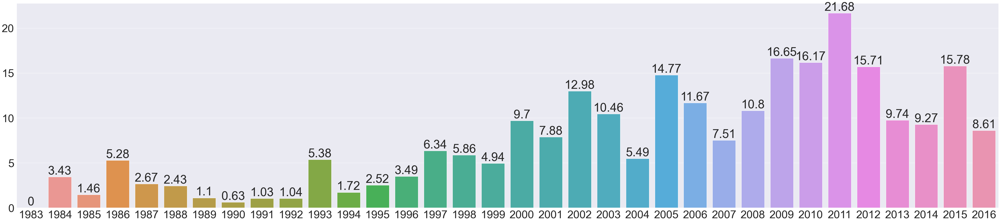

In [121]:
Namco_bar=sns.barplot(x='Year', y='Total_Sales', data=Namco_Sale)
Namco_bar.figure.set_size_inches(70,15)
sns.set(font_scale=4)
for i in Namco_bar.containers:
    Namco_bar.bar_label(i,)

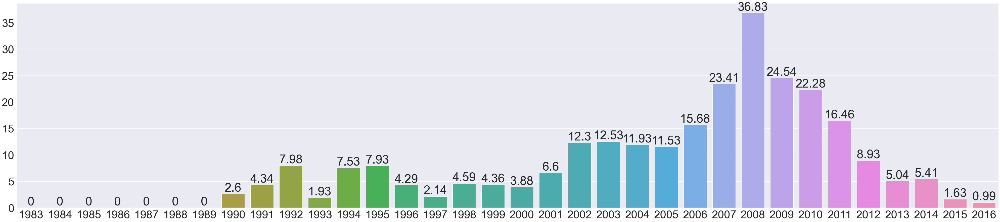

In [122]:
Sega_bar=sns.barplot(x='Year', y='Total_Sales', data=Sega_Sale)
Sega_bar.figure.set_size_inches(70,15)
sns.set(font_scale=4)
for i in Sega_bar.containers:
    Sega_bar.bar_label(i,)

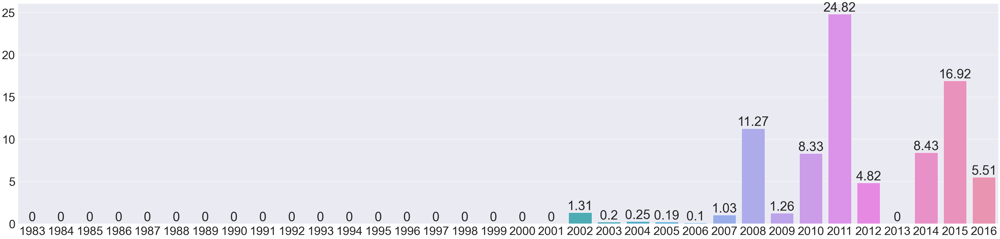

In [123]:
Bethesda_bar=sns.barplot(x='Year', y='Total_Sales', data=Bethesda_Sale)
Bethesda_bar.figure.set_size_inches(65,15)
sns.set(font_scale=4)
for i in Bethesda_bar.containers:
    Bethesda_bar.bar_label(i,)

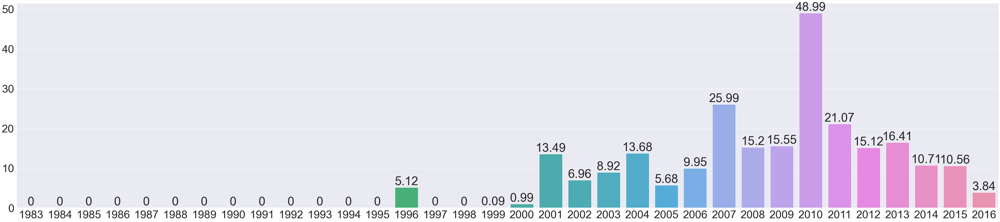

In [124]:
MS_bar=sns.barplot(x='Year', y='Total_Sales', data=Microsoft_Sale)
MS_bar.figure.set_size_inches(70,15)
sns.set(font_scale=4)
for i in MS_bar.containers:
    MS_bar.bar_label(i,)

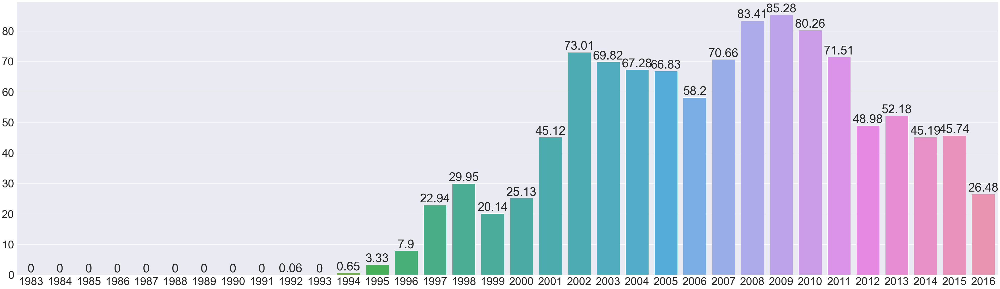

In [125]:
EA_bar=sns.barplot(x='Year', y='Total_Sales', data=EA_Sale)
EA_bar.figure.set_size_inches(70,20)
sns.set(font_scale=4)
for i in EA_bar.containers:
    EA_bar.bar_label(i,)

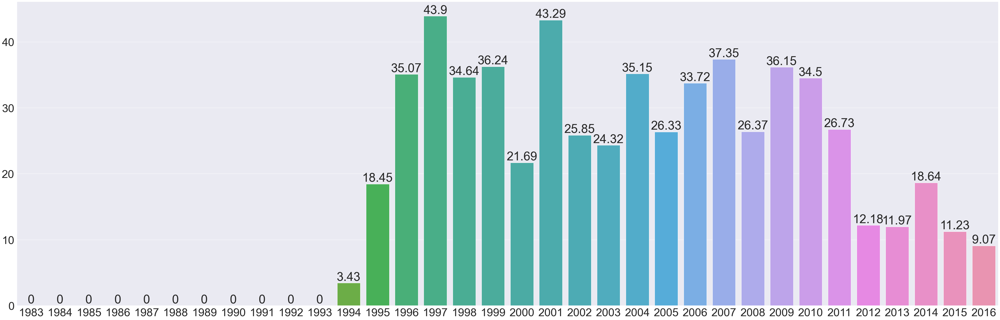

In [126]:
Sony_bar=sns.barplot(x='Year', y='Total_Sales', data=Sony_Sale)
Sony_bar.figure.set_size_inches(69,22)
sns.set(font_scale=4)
for i in Sony_bar.containers:
    Sony_bar.bar_label(i,)

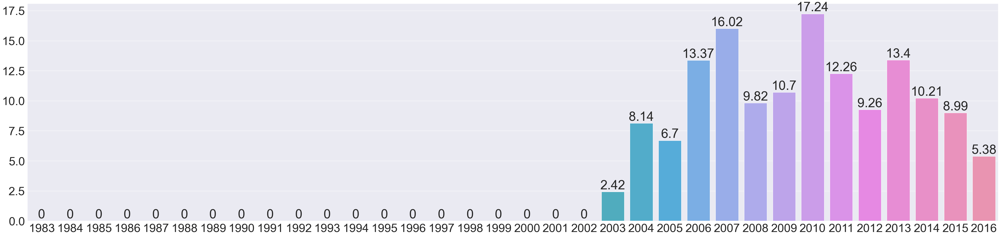

In [127]:
SqE_bar=sns.barplot(x='Year', y='Total_Sales', data=SqE_Sale)
SqE_bar.figure.set_size_inches(65,15)
sns.set(font_scale=4)
for i in SqE_bar.containers:
    SqE_bar.bar_label(i,)

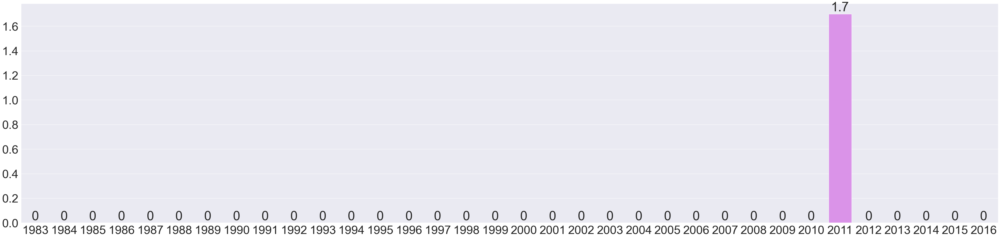

In [128]:
Valve_bar=sns.barplot(x='Year', y='Total_Sales', data=Valve_Sale)
Valve_bar.figure.set_size_inches(65,15)
sns.set(font_scale=4)
for i in Valve_bar.containers:
    Valve_bar.bar_label(i,)

In [129]:
#Now you may see that the barchart above for the company Valve seems empty, this was done on purpose. After I had done
#the barcharts I decided I was going to get the datasets for each company's stock prices. while looking for them I had
#noticed something interesting, the stock prices for Valve are kept private. so sadly I have no legal permission to use
#it for further study, so this means that fixing this data had run moot since I have no access to said data.

In [130]:
sns.set_style('white')

In [131]:
#After completion of the barcharts I decided to do some regression plots to see how the sales advanced through time.
#Now I predict that for the most part, this relationship will be positive steadily rising as the years go by

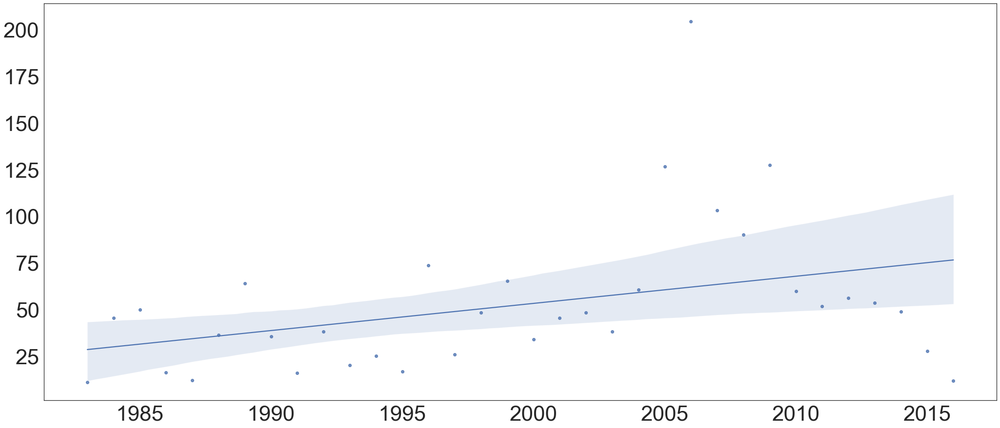

In [132]:
Nintendo_reg= sns.regplot(x=Nintendo_Sale['Year'], y=Nintendo_Sale['Total_Sales'])
Nintendo_reg.figure.set_size_inches(35,15)

In [133]:
#Now here we can see that I was right! The sales were rising as time went by. Granted the posotive skew is small this
#still shows that its positive. However I do want a way where I could see this better, so I made a line plot below.

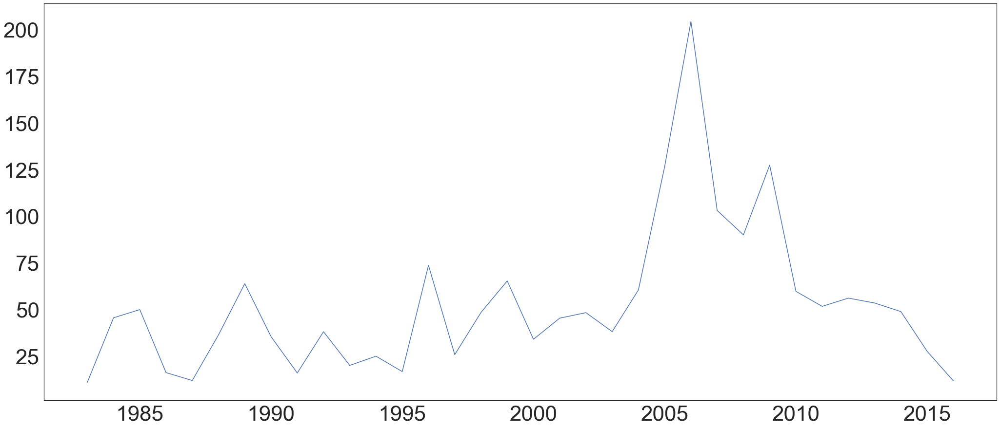

In [134]:
Nintendo_line= sns.lineplot(x=Nintendo_Sale['Year'], y=Nintendo_Sale['Total_Sales'])
Nintendo_line.figure.set_size_inches(35,15)

In [135]:
#With this line plot I feel that I can better see the positive climb of sales as time goes on. So I decided to continue
#this process with all the other publishers, A Regression plot followed by a Lineplot

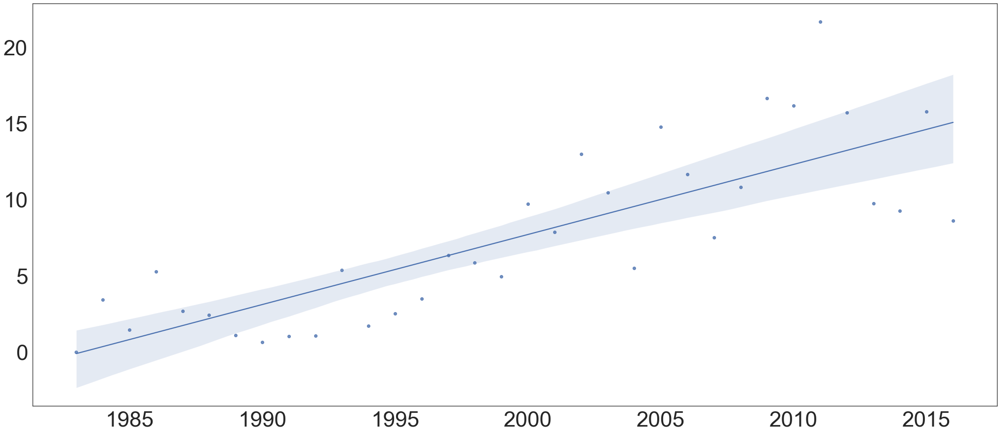

In [136]:
Namco_reg= sns.regplot(x=Namco_Sale['Year'], y=Namco_Sale['Total_Sales'])
Namco_reg.figure.set_size_inches(35,15)

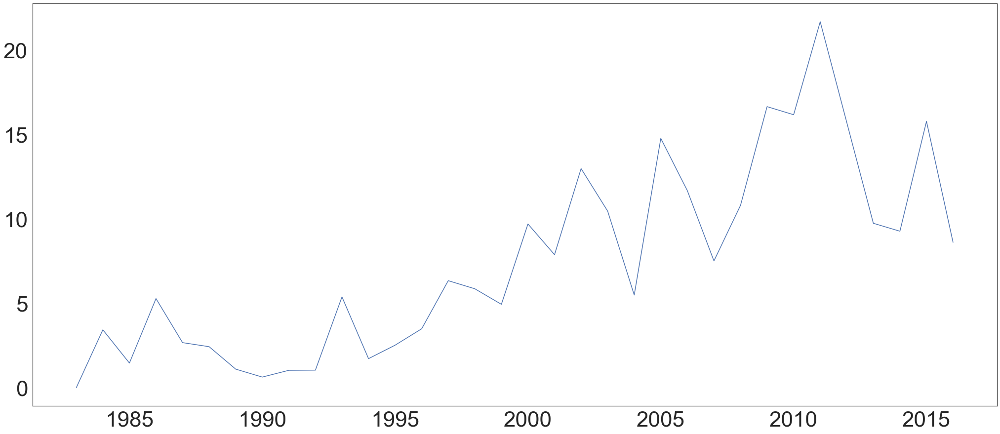

In [137]:
Namco_line= sns.lineplot(x=Namco_Sale['Year'], y=Namco_Sale['Total_Sales'])
Namco_line.figure.set_size_inches(35,15)

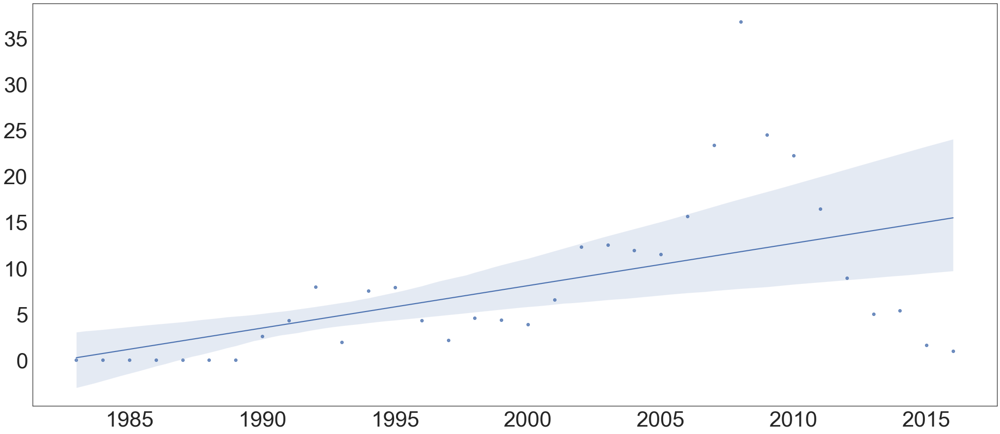

In [138]:
Sega_reg= sns.regplot(x=Sega_Sale['Year'], y=Sega_Sale['Total_Sales'])
Sega_reg.figure.set_size_inches(35,15)

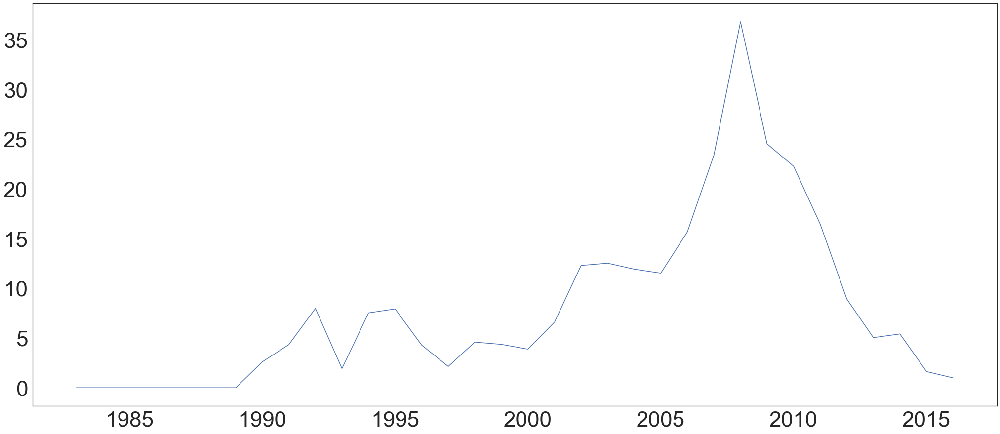

In [139]:
Sega_line= sns.lineplot(x=Sega_Sale['Year'], y=Sega_Sale['Total_Sales'])
Sega_line.figure.set_size_inches(35,15)

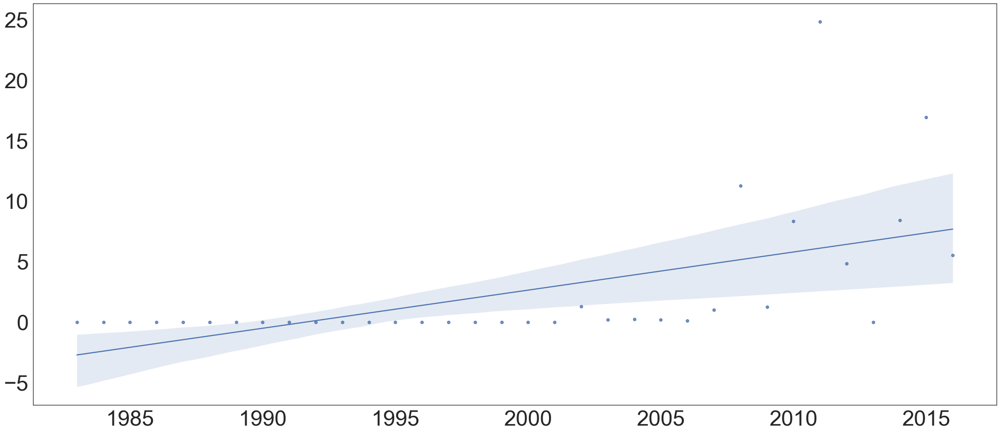

In [140]:
Bethesda_reg= sns.regplot(x=Bethesda_Sale['Year'], y=Bethesda_Sale['Total_Sales'])
Bethesda_reg.figure.set_size_inches(35,15)

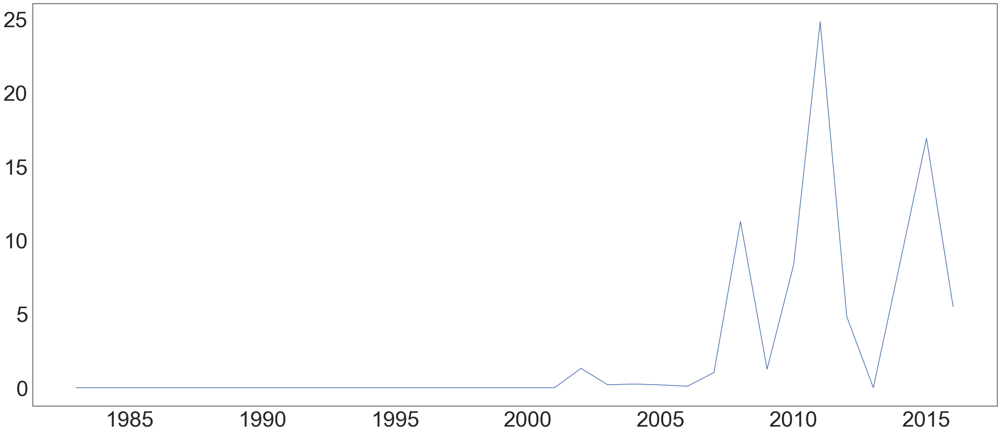

In [141]:
Bethesda_line= sns.lineplot(x=Bethesda_Sale['Year'], y=Bethesda_Sale['Total_Sales'])
Bethesda_line.figure.set_size_inches(35,15)

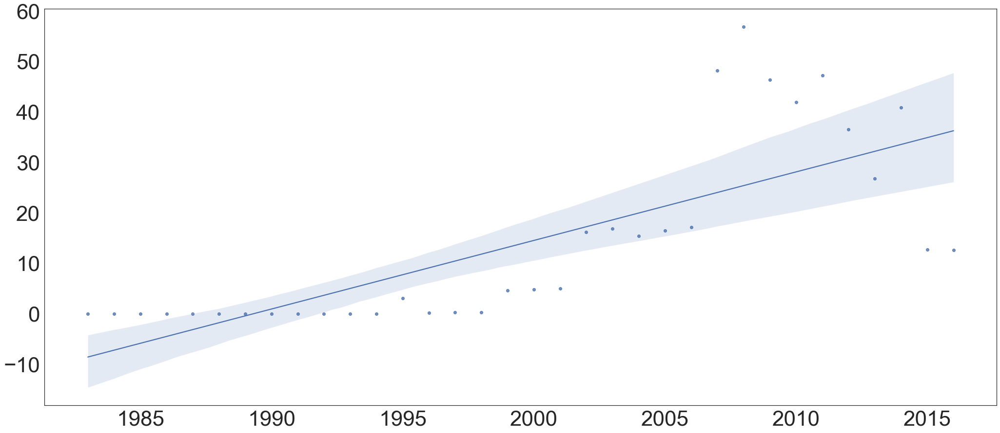

In [142]:
Ubisoft_reg= sns.regplot(x=Ubisoft_Sale['Year'], y=Ubisoft_Sale['Total_Sales'])
Ubisoft_reg.figure.set_size_inches(35,15)

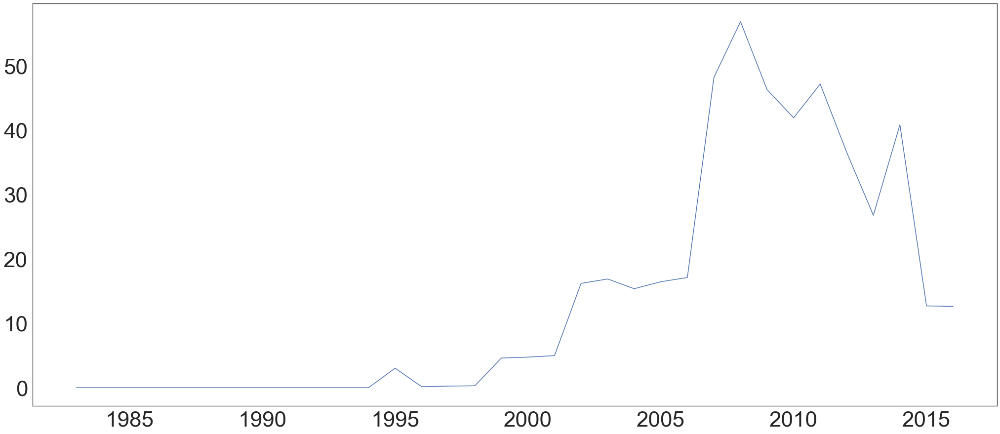

In [143]:
Ubisoft_line= sns.lineplot(x=Ubisoft_Sale['Year'], y=Ubisoft_Sale['Total_Sales'])
Ubisoft_line.figure.set_size_inches(35,15)

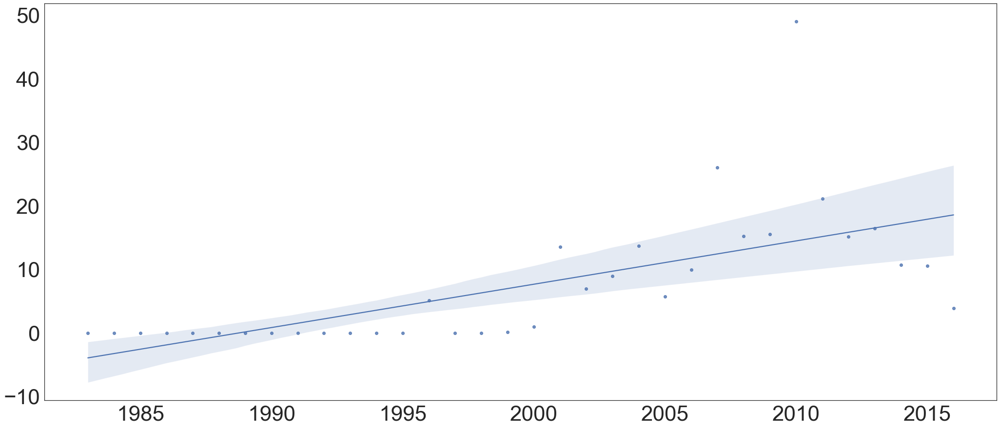

In [144]:
Microsoft_reg= sns.regplot(x=Microsoft_Sale['Year'], y=Microsoft_Sale['Total_Sales'])
Microsoft_reg.figure.set_size_inches(35,15)

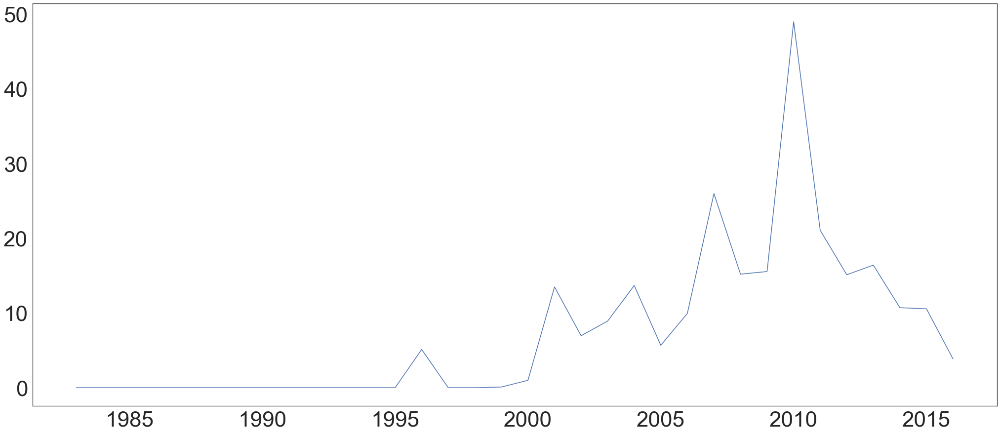

In [145]:
Microsoft_line= sns.lineplot(x=Microsoft_Sale['Year'], y=Microsoft_Sale['Total_Sales'])
Microsoft_line.figure.set_size_inches(35,15)

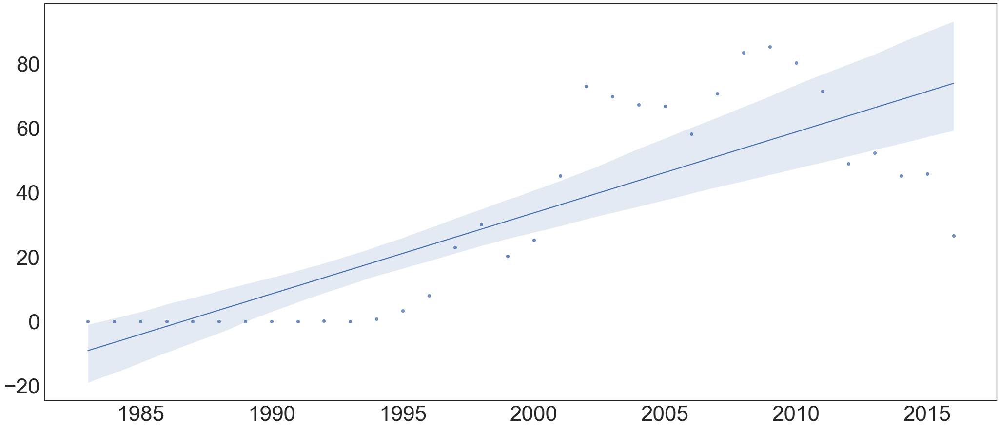

In [146]:
EA_reg= sns.regplot(x=EA_Sale['Year'], y=EA_Sale['Total_Sales'])
EA_reg.figure.set_size_inches(35,15)

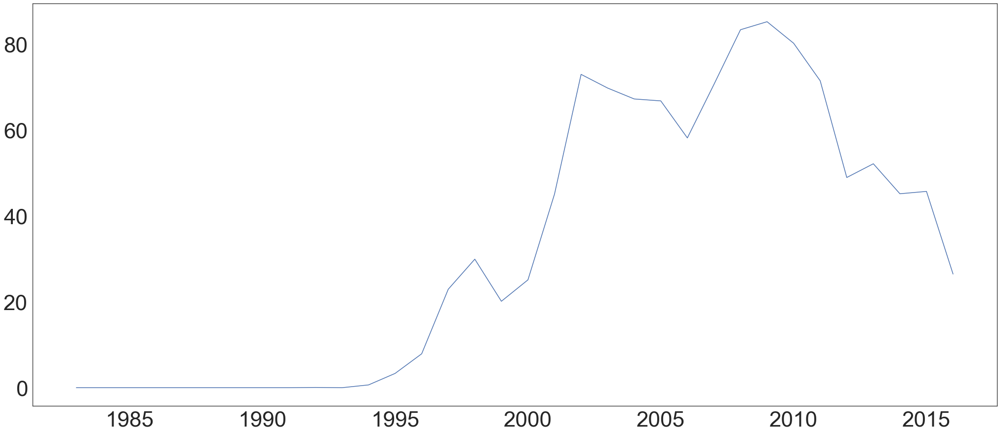

In [147]:
EA_line= sns.lineplot(x=EA_Sale['Year'], y=EA_Sale['Total_Sales'])
EA_line.figure.set_size_inches(35,15)

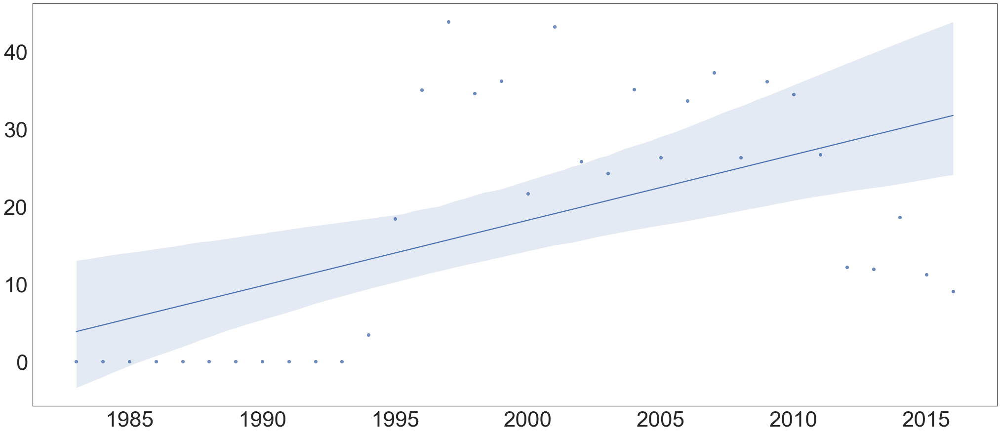

In [148]:
Sony_reg= sns.regplot(x=Sony_Sale['Year'], y=Sony_Sale['Total_Sales'])
Sony_reg.figure.set_size_inches(35,15)

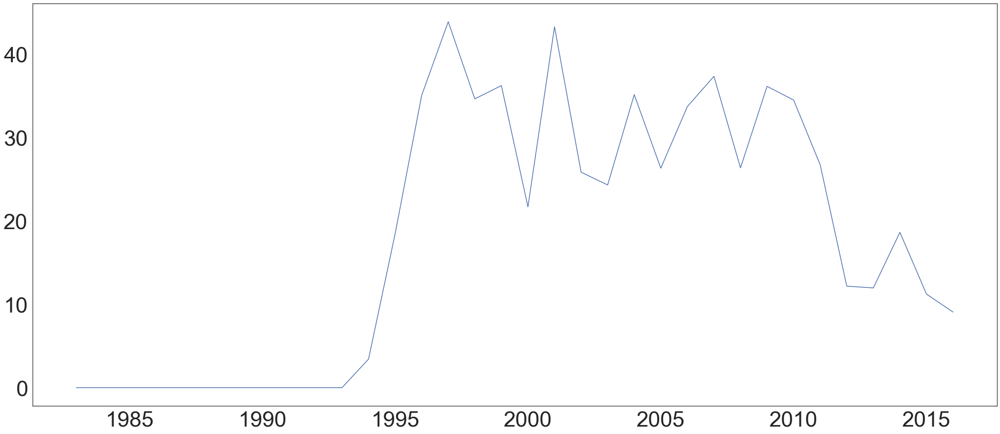

In [149]:
Sony_line= sns.lineplot(x=Sony_Sale['Year'], y=Sony_Sale['Total_Sales'])
Sony_line.figure.set_size_inches(35,15)

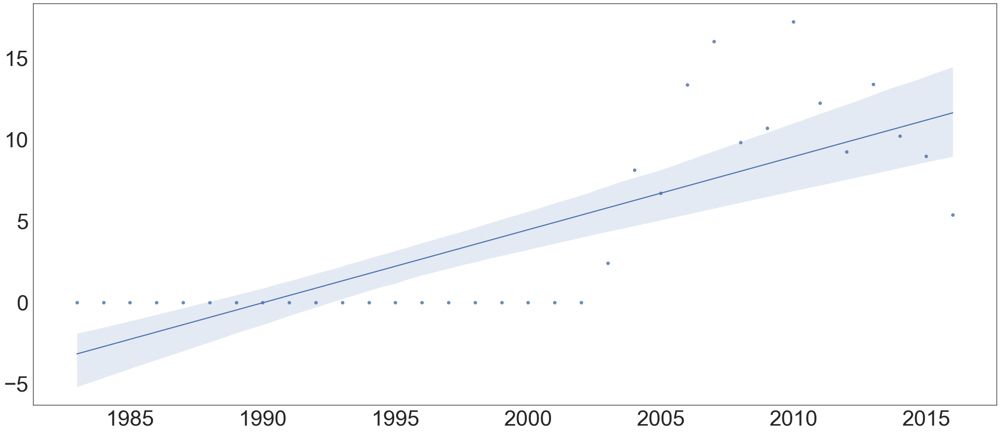

In [150]:
SqE_reg= sns.regplot(x=SqE_Sale['Year'], y=SqE_Sale['Total_Sales'])
SqE_reg.figure.set_size_inches(35,15)

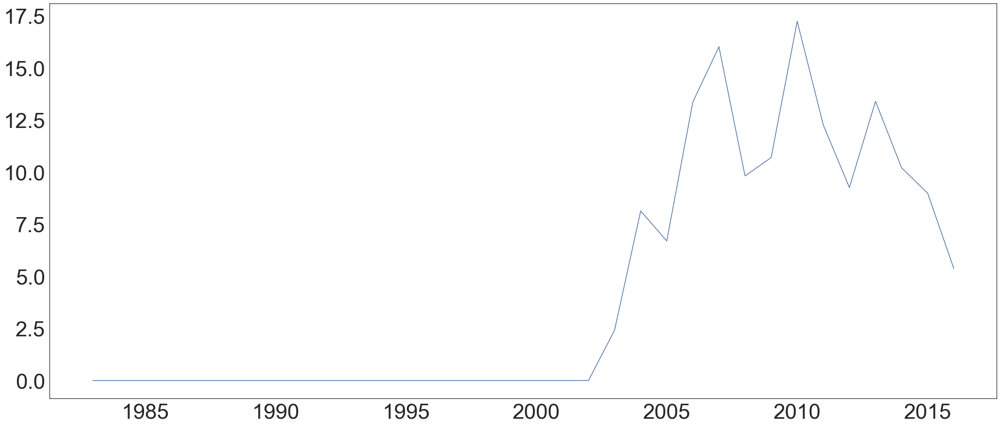

In [151]:
SqE_line= sns.lineplot(x=SqE_Sale['Year'], y=SqE_Sale['Total_Sales'])
SqE_line.figure.set_size_inches(35,15)

In [152]:
#As you can see above, all the game sales through the years are climing higher and higer, some more than others.

In [153]:
Nintendo_Stock = pd.read_csv('Nintendo_Stock.csv')

In [154]:
#With the stock prices it was a bit tricky. Like Valve, I found that some stocks were either private or were just branches
# of a larger corporation ie: Bethesda with Microsoft. And with some other companies, their stock history was only
#available from certain years and up. I used what I could anyways.

In [155]:
Nintendo_Stock.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1996-12-01,8.750000,9.750,8.500,9.1250,8.670166,1817500
1,1997-01-01,9.125000,9.250,7.500,8.0000,7.601243,1377200
2,1997-02-01,8.500000,9.000,7.750,8.8750,8.432627,927700
3,1997-03-01,8.546875,9.375,8.375,8.7500,8.313859,962000
4,1997-04-01,9.000000,9.375,8.625,8.9375,8.492013,1487900


In [156]:
Nintendo_Stock.shape

(241, 7)

In [157]:
Nintendo_Stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       241 non-null    object 
 1   Open       241 non-null    float64
 2   High       241 non-null    float64
 3   Low        241 non-null    float64
 4   Close      241 non-null    float64
 5   Adj Close  241 non-null    float64
 6   Volume     241 non-null    int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 13.3+ KB


In [158]:
#Here I just modified a column name because I just dont like white space

In [159]:
Nintendo_Stock.rename(columns={'Adj Close': 'Adj_Close'}, inplace=True )
Nintendo_Stock.head()

,Date,Open,High,Low,Close,Adj_Close,Volume
0,1996-12-01,8.750000,9.750,8.500,9.1250,8.670166,1817500
1,1997-01-01,9.125000,9.250,7.500,8.0000,7.601243,1377200
2,1997-02-01,8.500000,9.000,7.750,8.8750,8.432627,927700
3,1997-03-01,8.546875,9.375,8.375,8.7500,8.313859,962000
4,1997-04-01,9.000000,9.375,8.625,8.9375,8.492013,1487900


In [160]:
Nintendo_Stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       241 non-null    object 
 1   Open       241 non-null    float64
 2   High       241 non-null    float64
 3   Low        241 non-null    float64
 4   Close      241 non-null    float64
 5   Adj_Close  241 non-null    float64
 6   Volume     241 non-null    int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 13.3+ KB


In [161]:
#After some exploratory analysis of this dataset I decided to use the date and the Adj_Close columns to build lineplots
# so I can see the changes in prices over time. now I chose Adj_Close over Close since The closing price is simply the
#cash value of that specific piece of stock at day's end while the adjusted closing price reflects the closing price 
#of the stock in relation to other stock attributes (definition from google)

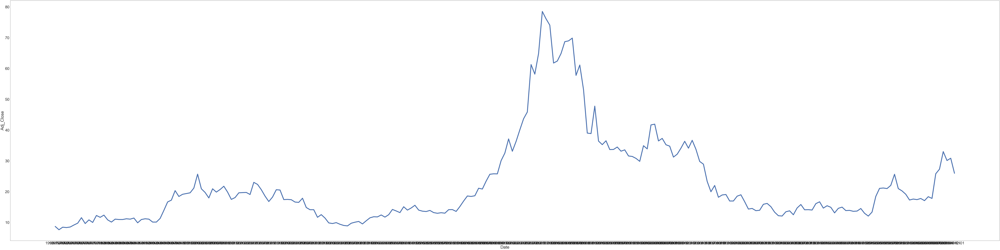

In [162]:
Nin_stock_line= sns.lineplot(x=Nintendo_Stock['Date'], y=Nintendo_Stock['Adj_Close'], linewidth=10)
Nin_stock_line.figure.set_size_inches(200,50) 


In [163]:
#I then repeated the same process with the other publishers below.

In [164]:
Namco_Stock = pd.read_csv('Namco_Stock.csv')

In [165]:
Namco_Stock.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2001-01-01,4220.0,4650.0,3800.0,4500.0,3264.472412,2471300
1,2001-02-01,4400.0,4600.0,4060.0,4320.0,3133.893311,2223400
2,2001-03-01,4220.0,4580.0,3800.0,4320.0,3133.893311,1973300
3,2001-04-01,4360.0,4550.0,4070.0,4220.0,3061.350098,1331400
4,2001-05-01,4120.0,4250.0,3610.0,3810.0,2763.920166,2782100


In [166]:
Namco_Stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192 entries, 0 to 191
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       192 non-null    object 
 1   Open       192 non-null    float64
 2   High       192 non-null    float64
 3   Low        192 non-null    float64
 4   Close      192 non-null    float64
 5   Adj Close  192 non-null    float64
 6   Volume     192 non-null    int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 10.6+ KB


In [167]:
Namco_Stock.shape

(192, 7)

In [168]:
Namco_Stock.rename(columns={'Adj Close': 'Adj_Close'}, inplace=True )
Namco_Stock.head()

,Date,Open,High,Low,Close,Adj_Close,Volume
0,2001-01-01,4220.0,4650.0,3800.0,4500.0,3264.472412,2471300
1,2001-02-01,4400.0,4600.0,4060.0,4320.0,3133.893311,2223400
2,2001-03-01,4220.0,4580.0,3800.0,4320.0,3133.893311,1973300
3,2001-04-01,4360.0,4550.0,4070.0,4220.0,3061.350098,1331400
4,2001-05-01,4120.0,4250.0,3610.0,3810.0,2763.920166,2782100


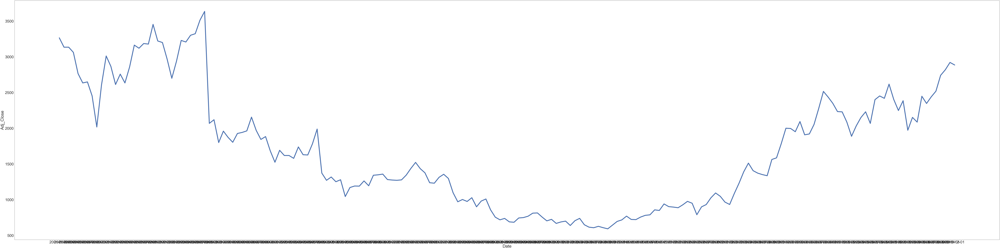

In [169]:
Nam_stock_line= sns.lineplot(x=Namco_Stock['Date'], y=Namco_Stock['Adj_Close'], linewidth=10)
Nam_stock_line.figure.set_size_inches(200,50) 

In [170]:
Sega_Stock = pd.read_csv('Sega_Stock.csv')

In [171]:
Sega_Stock.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-02-01,2.90,3.02,2.00,2.66,2.620469,4598100
1,2008-03-01,2.65,2.85,2.50,2.62,2.581063,2136000
2,2008-04-01,2.75,3.15,2.65,3.00,2.955416,10951200
3,2008-05-01,3.03,3.15,2.40,2.68,2.640171,4527200
4,2008-06-01,2.63,2.72,2.20,2.20,2.167305,4966500


In [172]:
Sega_Stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107 entries, 0 to 106
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       107 non-null    object 
 1   Open       107 non-null    float64
 2   High       107 non-null    float64
 3   Low        107 non-null    float64
 4   Close      107 non-null    float64
 5   Adj Close  107 non-null    float64
 6   Volume     107 non-null    int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 6.0+ KB


In [173]:
Sega_Stock.shape

(107, 7)

In [174]:
Sega_Stock.rename(columns={'Adj Close': 'Adj_Close'}, inplace=True )
Sega_Stock.head()

,Date,Open,High,Low,Close,Adj_Close,Volume
0,2008-02-01,2.90,3.02,2.00,2.66,2.620469,4598100
1,2008-03-01,2.65,2.85,2.50,2.62,2.581063,2136000
2,2008-04-01,2.75,3.15,2.65,3.00,2.955416,10951200
3,2008-05-01,3.03,3.15,2.40,2.68,2.640171,4527200
4,2008-06-01,2.63,2.72,2.20,2.20,2.167305,4966500


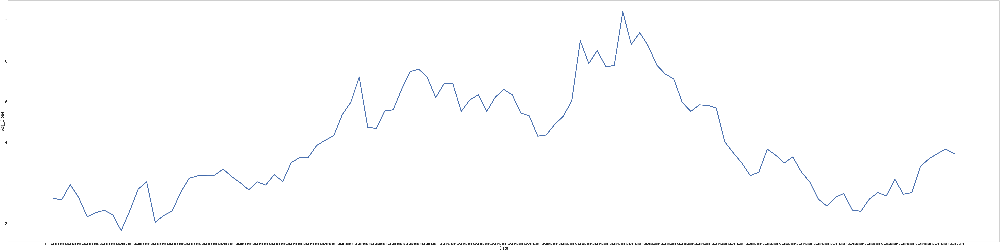

In [175]:
Sega_stock_line= sns.lineplot(x=Sega_Stock['Date'], y=Sega_Stock['Adj_Close'], linewidth=10)
Sega_stock_line.figure.set_size_inches(200,50)

In [176]:
Ubisoft_Stock = pd.read_csv('Ubisoft_Stock.csv')

In [177]:
Ubisoft_Stock.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-02-01,2.75,2.95,2.55,2.57,2.554185,11800
1,2010-03-01,2.57,2.80,2.39,2.65,2.633693,643600
2,2010-04-01,2.65,2.98,2.59,2.59,2.574062,159500
3,2010-05-01,2.59,2.59,1.83,1.86,1.848554,29200
4,2010-06-01,1.93,1.94,1.58,1.58,1.570277,13500


In [178]:
Ubisoft_Stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83 entries, 0 to 82
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       83 non-null     object 
 1   Open       83 non-null     float64
 2   High       83 non-null     float64
 3   Low        83 non-null     float64
 4   Close      83 non-null     float64
 5   Adj Close  83 non-null     float64
 6   Volume     83 non-null     int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 4.7+ KB


In [179]:
Ubisoft_Stock.shape

(83, 7)

In [180]:
Ubisoft_Stock.rename(columns={'Adj Close': 'Adj_Close'}, inplace=True )
Ubisoft_Stock.head()

,Date,Open,High,Low,Close,Adj_Close,Volume
0,2010-02-01,2.75,2.95,2.55,2.57,2.554185,11800
1,2010-03-01,2.57,2.80,2.39,2.65,2.633693,643600
2,2010-04-01,2.65,2.98,2.59,2.59,2.574062,159500
3,2010-05-01,2.59,2.59,1.83,1.86,1.848554,29200
4,2010-06-01,1.93,1.94,1.58,1.58,1.570277,13500


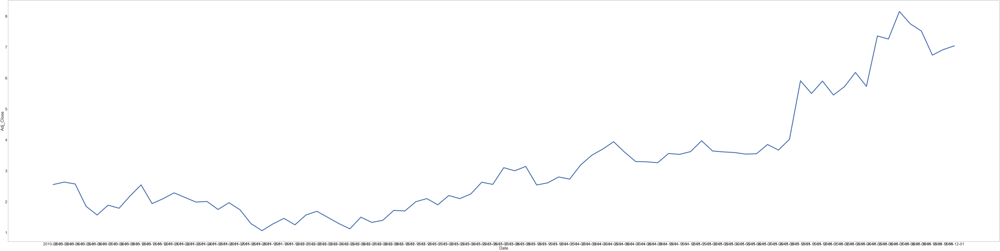

In [181]:
Ubi_stock_line= sns.lineplot(x=Ubisoft_Stock['Date'], y=Ubisoft_Stock['Adj_Close'], linewidth=10)
Ubi_stock_line.figure.set_size_inches(200,50)

In [182]:
Microsoft_Stock = pd.read_csv('MS_Stock.csv')

In [183]:
Microsoft_Stock.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2001-01-01,22.062500,32.375000,21.43750,30.53125,19.190571,2005531200
1,2001-02-01,30.406250,32.531250,26.93750,29.50000,18.542370,1536895600
2,2001-03-01,29.281250,30.562500,24.87500,27.34375,17.187042,1895349800
3,2001-04-01,27.406250,35.549999,25.53125,33.87500,21.292297,2075807000
4,2001-05-01,33.830002,36.075001,33.62500,34.59000,21.741716,1777305800


In [184]:
Microsoft_Stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192 entries, 0 to 191
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       192 non-null    object 
 1   Open       192 non-null    float64
 2   High       192 non-null    float64
 3   Low        192 non-null    float64
 4   Close      192 non-null    float64
 5   Adj Close  192 non-null    float64
 6   Volume     192 non-null    int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 10.6+ KB


In [185]:
Microsoft_Stock.shape

(192, 7)

In [186]:
Microsoft_Stock.rename(columns={'Adj Close': 'Adj_Close'}, inplace=True )
Microsoft_Stock.head()

,Date,Open,High,Low,Close,Adj_Close,Volume
0,2001-01-01,22.062500,32.375000,21.43750,30.53125,19.190571,2005531200
1,2001-02-01,30.406250,32.531250,26.93750,29.50000,18.542370,1536895600
2,2001-03-01,29.281250,30.562500,24.87500,27.34375,17.187042,1895349800
3,2001-04-01,27.406250,35.549999,25.53125,33.87500,21.292297,2075807000
4,2001-05-01,33.830002,36.075001,33.62500,34.59000,21.741716,1777305800


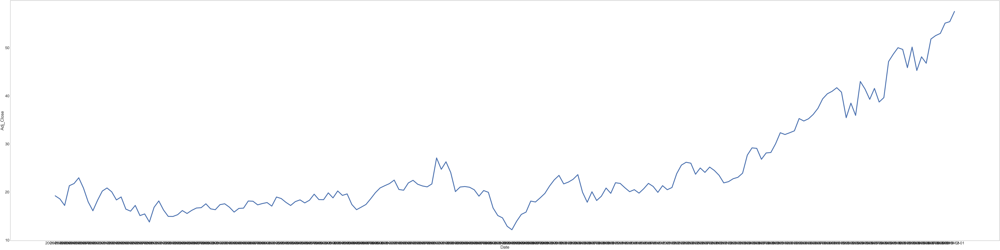

In [187]:
MS_stock_line= sns.lineplot(x=Microsoft_Stock['Date'], y=Microsoft_Stock['Adj_Close'], linewidth=10)
MS_stock_line.figure.set_size_inches(200,50)

In [188]:
EA_Stock = pd.read_csv('EA_Stock.csv')

In [189]:
EA_Stock.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1990-01-01,0.000000,0.570313,0.476563,0.523438,0.518750,9756800
1,1990-02-01,0.000000,0.625000,0.492188,0.609375,0.603917,16460800
2,1990-03-01,0.000000,0.609375,0.523438,0.531250,0.526492,28593600
3,1990-04-01,0.546875,0.898438,0.539063,0.890625,0.882648,54520000
4,1990-05-01,0.906250,1.054688,0.875000,1.039063,1.029757,48907200


In [190]:
EA_Stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 324 entries, 0 to 323
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       324 non-null    object 
 1   Open       324 non-null    float64
 2   High       324 non-null    float64
 3   Low        324 non-null    float64
 4   Close      324 non-null    float64
 5   Adj Close  324 non-null    float64
 6   Volume     324 non-null    int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 17.8+ KB


In [191]:
EA_Stock.shape

(324, 7)

In [192]:
EA_Stock.rename(columns={'Adj Close': 'Adj_Close'}, inplace=True )
EA_Stock.head()

,Date,Open,High,Low,Close,Adj_Close,Volume
0,1990-01-01,0.000000,0.570313,0.476563,0.523438,0.518750,9756800
1,1990-02-01,0.000000,0.625000,0.492188,0.609375,0.603917,16460800
2,1990-03-01,0.000000,0.609375,0.523438,0.531250,0.526492,28593600
3,1990-04-01,0.546875,0.898438,0.539063,0.890625,0.882648,54520000
4,1990-05-01,0.906250,1.054688,0.875000,1.039063,1.029757,48907200


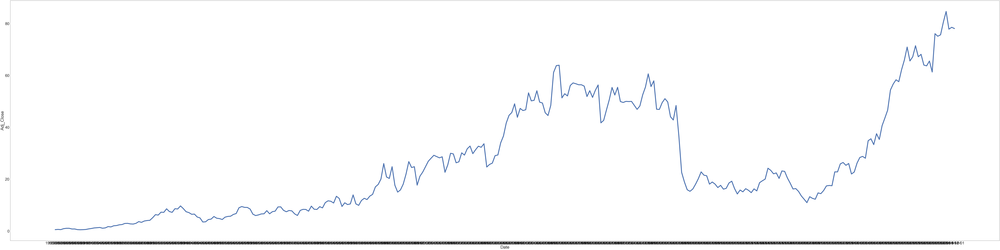

In [193]:
EA_stock_line= sns.lineplot(x=EA_Stock['Date'], y=EA_Stock['Adj_Close'], linewidth=10)
EA_stock_line.figure.set_size_inches(200,50)

In [194]:
SqE_Stock = pd.read_csv('SqE_Stock.csv')

In [195]:
SqE_Stock.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2019-01-01,13.74,16.83,12.61,16.60,15.715981,4706
1,2019-02-01,16.60,16.60,14.38,14.70,13.917163,5185
2,2019-03-01,14.70,18.16,14.70,18.16,17.192905,109
3,2019-04-01,18.16,18.16,15.66,17.25,16.486200,4968
4,2019-05-01,17.25,17.25,15.72,15.72,15.023947,2295


In [196]:
SqE_Stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       24 non-null     object 
 1   Open       24 non-null     float64
 2   High       24 non-null     float64
 3   Low        24 non-null     float64
 4   Close      24 non-null     float64
 5   Adj Close  24 non-null     float64
 6   Volume     24 non-null     int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 1.4+ KB


In [197]:
SqE_Stock.shape

(24, 7)

In [198]:
SqE_Stock.rename(columns={'Adj Close': 'Adj_Close'}, inplace=True )
SqE_Stock.head()

,Date,Open,High,Low,Close,Adj_Close,Volume
0,2019-01-01,13.74,16.83,12.61,16.60,15.715981,4706
1,2019-02-01,16.60,16.60,14.38,14.70,13.917163,5185
2,2019-03-01,14.70,18.16,14.70,18.16,17.192905,109
3,2019-04-01,18.16,18.16,15.66,17.25,16.486200,4968
4,2019-05-01,17.25,17.25,15.72,15.72,15.023947,2295


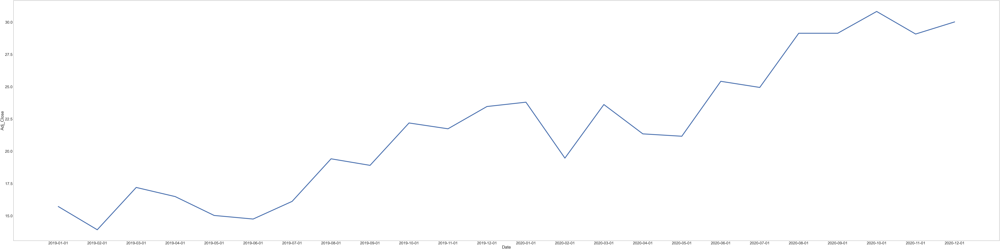

In [199]:
SqE_stock_line= sns.lineplot(x=SqE_Stock['Date'], y=SqE_Stock['Adj_Close'], linewidth=10)
SqE_stock_line.figure.set_size_inches(200,50)

In [200]:
#What's nice about these lineplots is that some of them hold a similar shape to their Global_total sale lineplots, and 
#both seem to hold a pretty steady incline.
#So from this we can see that their sales do affect their stock prices and I can use this as a tool to better study
#Video game releases and calculate times to buy and sell their publishers stock. There are other Factors that can be
#used to predict better buy/sell times, but until we can find something that can accurately hype I believe that I can
#now have a better understanding on how their stocks flow.
